In [ ]:
import numpy as np
import pandas as pd
import tqdm
import re

In [ ]:
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds

In [ ]:
%%bash
mkdir -p ./data
wget -q https://github.com/vadim0912/ML2023/raw/master/lecture09/BX-Books.csv.gz -P data/
wget -q https://github.com/vadim0912/ML2023/raw/master/lecture09/BX-Book-Ratings.csv.gz -P data/
wget -q https://github.com/vadim0912/ML2023/raw/master/lecture09/BX-Users.csv.gz -P data/

In [ ]:
!gunzip -v 'data/BX-Book-Ratings.csv.gz' 'data/'
!gunzip -v 'data/BX-Books.csv.gz' 'data/'
!gunzip -v 'data/BX-Users.csv.gz' 'data/'

data/BX-Book-Ratings.csv.gz:	 77.6% -- replaced with data/BX-Book-Ratings.csv
gzip: data/ is a directory -- ignored
data/BX-Books.csv.gz:	 78.7% -- replaced with data/BX-Books.csv
gzip: data/ is a directory -- ignored
data/BX-Users.csv.gz:	 75.0% -- replaced with data/BX-Users.csv
gzip: data/ is a directory -- ignored


# Домашнее задание

Data contains the book rating information. Ratings (Book-Rating) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.

### 1. Реализовать персональный топ  - принимает на вход возраст и локацию, на выходе персональный топ   - 1 балл

Персональный топ - это топ товаров по похожим возрасту/интересам/локации. Как сделать? Разбить на сегменты по выбраным признакам. Топ делать по книгам с хорошим средним рейтингом.

### 2. На основе метода кластеризации похожих пользователей построить рекомендации (Слайд 27) - 3 балла

Нужно топ-10 рекомендаций с самой высокой оценкой. Считаем среднюю оценку для каждой книги по кластеру и выводим топ-10 книг.

### 3. Совстречаемость - 3 балла

В совстречаемости также учитывать оценки. Вес пары книг встретившихся у пользователя - полусумма их оценок.

### 4. Коллаборативная фильтрация - 3 балла

Коллаборативную фильтрацию реализовывать как на слайде 51 презентации, посоветовав каждому пользователю топ-10 книг с самой высокой оценкой. Сделать рекомендации User-based и Item-based и сравнить.

Если совсем сложно - можно сделать как в семинарской части, поставив оценку "0", если рейтинг < 5 и "1" - в противном случае. Тогда максимум за это - 1 балл. Реализовать U2I и I2I рекомендации.

### Примечание:

Так как пользователей много - можно зафиксировать несколько произвольных и для них уже составлять рекомендации

Работоспособность I2I можно проверять на известных книгах (Гарри Поттер, Властелин Колец, Интервью с вампиром, Код-Да-Винчи, Маленький Принц)

Рейтинг книг обязательно нужно учитывать

Не забываем также предобработать данные - выкинуть выбросы-пользователей и выбросы-книги.

# Жесткий дедлайн 20 мая 23:59

Выводить в качестве рекомендаций лучше названия книг, картинки (если они есть) и соответствующие метрики близости.

In [ ]:
books = pd.read_csv("data/BX-Books.csv")

<ipython-input-5-0dd0cebff91d>:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv("data/BX-Books.csv")


In [ ]:
interactions = pd.read_csv("data/BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")

In [ ]:
interactions = interactions[interactions["Book-Rating"] != 0]

In [ ]:
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})

In [ ]:
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})

In [ ]:
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])

# Препроцессинг данных

In [ ]:
interactions = interactions[(interactions["user_num"] > 5) &
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]

In [ ]:
users = pd.read_csv('data/BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')

In [ ]:
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [ ]:
interactions = pd.merge(interactions, users, on="User-ID")

In [ ]:
interactions = interactions[(interactions["Age"]>=18) & (interactions["Age"]<=100)]

In [ ]:
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

<ipython-input-17-41211439fd63>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  interactions["product_id"] = le.fit_transform(interactions["ISBN"])
<ipython-input-17-41211439fd63>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  interactions["vid"] = le.fit_transform(interactions["User-ID"])


In [ ]:
interactions.drop(["User-ID", "ISBN"], axis=1, inplace=True)

<ipython-input-18-144732cb52b2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  interactions.drop(["User-ID", "ISBN"], axis=1, inplace=True)


In [ ]:
csr_rates = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])),
                            shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))

In [ ]:
def process_locations(location: str) -> str:
    res = location.split(",")
    for i in range(len(res)):
        res[i] = res[i].strip().lower()
    while "" in res:
        res.remove("")

    return " ".join(res) + " "

In [ ]:
interactions["Location"] = interactions["Location"].apply(process_locations)

In [ ]:
avg_rating = interactions[["product_id", "Book-Rating"]].groupby("product_id").mean().reset_index()

In [ ]:
avg_age = interactions[["product_id", "Age"]].groupby("product_id").mean().reset_index()

In [ ]:
avg_rating.rename(columns={"Book-Rating": "Avg-Rating"}, inplace=True)

In [ ]:
avg_age.rename(columns={"Age": "Avg-Age"}, inplace=True)

In [ ]:
interactions = pd.merge(interactions, avg_rating, on="product_id")

In [ ]:
interactions = pd.merge(interactions, avg_age, on="product_id")

In [ ]:
raw_interactions = interactions.copy()

In [ ]:
raw_interactions[["Avg-Rating", "Avg-Age"]] = raw_interactions[["Avg-Rating", "Avg-Age"]].apply(lambda x: round(x, 2))

In [ ]:
raw_interactions

,Book-Rating,user_num,books_num,picture_url,Book-Title,Location,Age,product_id,vid,Avg-Rating,Avg-Age
0,9,8,18,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,stuttgart germany,31.0,10279,2306,8.6,24.8
1,10,8,43,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,fürth,29.0,10279,3543,8.6,24.8
2,9,8,11,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,mönchengladbach nordrhein-westfalen germany,27.0,10279,7385,8.6,24.8
3,6,8,6,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,pratteln baselland switzerland,18.0,10279,2863,8.6,24.8
4,9,8,12,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,bockenheim rheinland-pfalz germany,19.0,10279,4220,8.6,24.8
...,...,...,...,...,...,...,...,...,...,...,...
78967,10,6,6,http://images.amazon.com/images/P/8838918600.0...,Il Giro Di Boa,pescara abruzzo italy,33.0,10579,630,9.0,36.5
78968,8,6,30,http://images.amazon.com/images/P/8838918600.0...,Il Giro Di Boa,olsberg aargau switzerland,40.0,10579,2852,9.0,36.5
78969,7,6,6,http://images.amazon.com/images/P/0525460543.0...,The Prince of Egypt Collector's Edition Storybook,henderson kentucky usa,42.0,6140,5093,7.0,42.0
78970,9,8,10,http://images.amazon.com/images/P/1860465811.0...,Wind-Up Bird Chronicle,edinburgh scotland united kingdom,37.0,10091,5521,9.0,37.0


In [ ]:
interactions.drop(["Book-Rating", "user_num", "books_num"], axis=1, inplace=True)

In [ ]:
locations = interactions[["product_id", "Location"]].groupby("product_id").sum()["Location"]

In [ ]:
interactions.drop("Location", axis = 1, inplace=True)

In [ ]:
interactions = pd.merge(interactions, locations, on="product_id")

In [ ]:
interactions.drop(["vid", "Age"], axis = 1, inplace=True)

In [ ]:
interactions

,picture_url,Book-Title,product_id,Avg-Rating,Avg-Age,Location
0,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10279,8.6,24.8,stuttgart germany fürth mönchengladbach nordrh...
1,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10279,8.6,24.8,stuttgart germany fürth mönchengladbach nordrh...
2,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10279,8.6,24.8,stuttgart germany fürth mönchengladbach nordrh...
3,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10279,8.6,24.8,stuttgart germany fürth mönchengladbach nordrh...
4,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10279,8.6,24.8,stuttgart germany fürth mönchengladbach nordrh...
...,...,...,...,...,...,...
78967,http://images.amazon.com/images/P/8838918600.0...,Il Giro Di Boa,10579,9.0,36.5,pescara abruzzo italy olsberg aargau switzerland
78968,http://images.amazon.com/images/P/8838918600.0...,Il Giro Di Boa,10579,9.0,36.5,pescara abruzzo italy olsberg aargau switzerland
78969,http://images.amazon.com/images/P/0525460543.0...,The Prince of Egypt Collector's Edition Storybook,6140,7.0,42.0,henderson kentucky usa
78970,http://images.amazon.com/images/P/1860465811.0...,Wind-Up Bird Chronicle,10091,9.0,37.0,edinburgh scotland united kingdom


In [ ]:
interactions.drop_duplicates(subset="product_id", inplace=True)

In [ ]:
interactions[["Avg-Rating", "Avg-Age"]] = interactions[["Avg-Rating", "Avg-Age"]].apply(lambda x: round(x, 2))

### Ищем id нужных книг

In [ ]:
def find_book_idx(title: str, df: pd.DataFrame) -> int:
    for i, j in df[["product_id", "Book-Title"]].drop_duplicates().values:
        if title in j:
            print("idx:", i, "\tBook Title:", j)

In [ ]:
find_book_idx("David Copperfield", interactions)

idx: 1055 	Book Title: David Copperfield (Penguin Classics)
idx: 10056 	Book Title: David Copperfield (Wordsworth Classics)


# Задание 1

In [ ]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                headers = {"User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64)\
                 AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3"}
                r = requests.get(i, headers=headers)
                im = Image.open(BytesIO(r.content))

            except:
                if measure is not None:
                    print("measure = {}".format(np.round(measure[cnt], 4)))
                    cnt += 1
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("measure = {}".format(np.round(measure[cnt], 4)))
                cnt += 1
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [ ]:
class PersonalTop():
    def __init__(self, Int: pd.DataFrame):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int

    def top_items(self, age: float, location: str) -> pd.DataFrame:
        # будем брать пересечение топа по возрасту и топа по региону
        best_by_age = self.interactions[abs(self.interactions["Avg-Age"] - age) <= 5]
        best_by_region = self.interactions[self.interactions["Location"].str.contains(location)]
        suitable_items = pd.merge(best_by_age, best_by_region, how="inner")

        # если рекомендаций не будет хватать, то будем смотреть на возраст, т.к. это более релевантно
        # (скорее всего, люди одного возраста будут читать одно и то же независимо от страны)
        if suitable_items.shape[0] < 10:
            suitable_items = best_by_age

        else:
            age_distance = 6
            while suitable_items.shape[0] < 10:
                suitable_items = self.interactions[abs(self.interactions["Avg-Age"] - age) <= age_distance]
                age_distance += 1

        suitable_items = suitable_items.sort_values("Avg-Rating", ascending=False).head(10)
        rec_imaging(suitable_items["product_id"].values, self.product_id_to_url, suitable_items["Avg-Rating"].values)
        return suitable_items[["Book-Title", "picture_url", "Avg-Rating"]].head(10)

In [ ]:
top = PersonalTop(interactions)

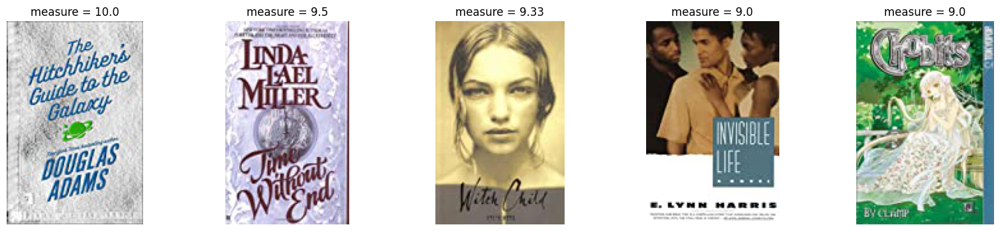

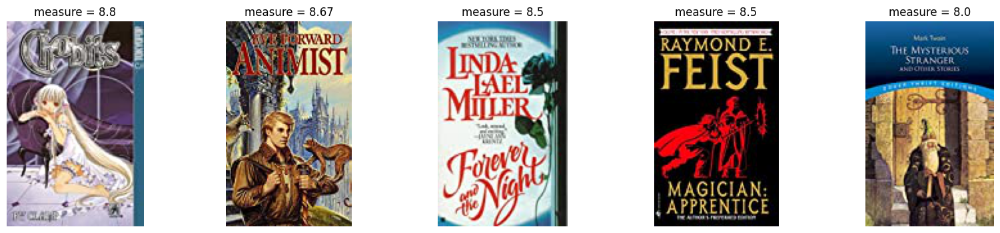

,Book-Title,picture_url,Avg-Rating
0,The Hitchhiker's Guide to the Galaxy,http://images.amazon.com/images/P/0345418913.0...,10.00
15,Time Without End,http://images.amazon.com/images/P/0425150429.0...,9.50
14,Witch Child,http://images.amazon.com/images/P/0763618292.0...,9.33
13,Invisible Life: A Novel,http://images.amazon.com/images/P/0385469683.0...,9.00
12,Chobits (Chobits),http://images.amazon.com/images/P/1591821533.0...,9.00
10,Chobits (Chobits),http://images.amazon.com/images/P/1591822580.0...,8.80
7,Animist,http://images.amazon.com/images/P/0812574621.0...,8.67
16,Forever and the Night,http://images.amazon.com/images/P/0425140601.0...,8.50
3,Magician: Apprentice (Riftwar Saga),http://images.amazon.com/images/P/0553564943.0...,8.50
9,The Mysterious Stranger and Other Stories (Dov...,http://images.amazon.com/images/P/0486270696.0...,8.00


In [ ]:
top.top_items(20, "alabama")

 # Задание 2

In [ ]:
class Clusterization():
    def __init__(self, interactions):
        self.product_id_to_url = {}
        for i in interactions[["product_id", "picture_url"]].drop_duplicates(subset="product_id").values:
            self.product_id_to_url[i[0]] = i[1]
        self.csr_rates = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])),
                                    shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))
        self.interactions = interactions.copy()
        self.interactions.drop("Avg-Rating", axis=1, inplace=True)

    def get_rec(self, user, distance_function):
        csr_matrix = self.csr_rates.toarray()
        user_rates = csr_matrix[user]
        watched_items = np.where(user_rates != 0)[0]

        # считаем расстояние по выбранной метрике между пользователем idx и всеми пользователями
        metrics = distance_function([user_rates], csr_matrix)[0]
        metrics_dict = dict(enumerate(metrics))
        metrics_dict = sorted(metrics_dict.items(), key=lambda x: x[1], reverse=True)

        # будем брать 500 самых близких пользователей
        neighbours = metrics_dict[:500]
        cs_neighbours = []
        for neighbour in neighbours:
            cs_neighbours.append(csr_matrix[neighbour[0]])
        cs_neighbours = np.asarray(cs_neighbours)

        # посчитаем средний рейтинг по кластеру
        rates = np.sum(cs_neighbours, axis=0)
        n_users = np.sum(cs_neighbours.astype(bool), axis = 0, dtype=float)
        n_users[n_users < 10] = np.nan
        avg_ratings = rates / n_users
        avg_ratings = np.nan_to_num(avg_ratings)

        # чтобы не рекомендовать уже просмотренные - зануляем веса просмотренных
        total_rate = (1 - user_rates.astype(bool)) * avg_ratings

        rate_dict = dict(enumerate(total_rate))
        recomendations = pd.DataFrame(data={"product_id": rate_dict.keys(), "Avg-Rating": rate_dict.values()})
        recomendations = pd.merge(self.interactions, recomendations, on="product_id").drop_duplicates(subset="product_id")
        recomendations = recomendations.sort_values("Avg-Rating", ascending=False).head(10)
        rec_imaging(recomendations.product_id.array, self.product_id_to_url, recomendations["Avg-Rating"].values.astype(float))
        return recomendations[["Book-Title", "picture_url", "Avg-Rating"]]

In [ ]:
clusterization = Clusterization(raw_interactions)

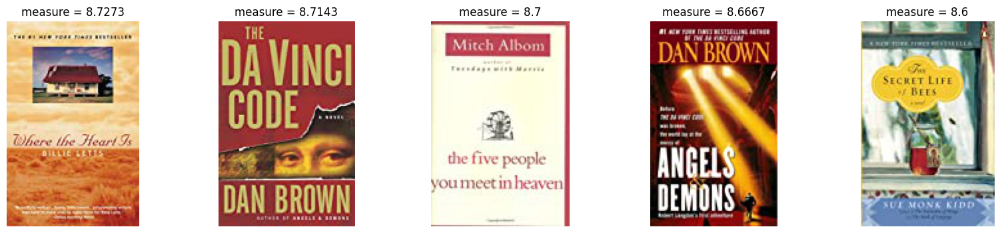

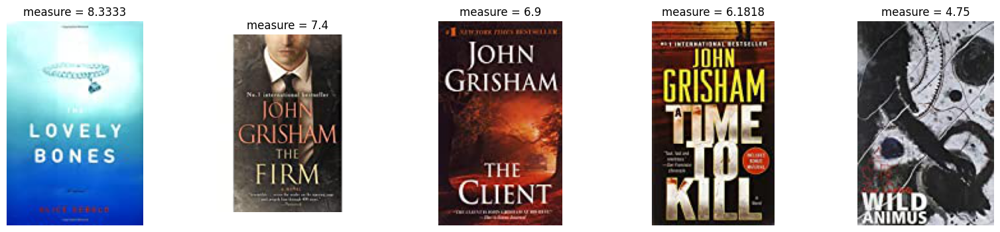

,Book-Title,picture_url,Avg-Rating
14728,Where the Heart Is (Oprah's Book Club (Paperba...,http://images.amazon.com/images/P/0446672211.0...,8.727273
9477,The Da Vinci Code,http://images.amazon.com/images/P/0385504209.0...,8.714286
750,The Five People You Meet in Heaven,http://images.amazon.com/images/P/0786868716.0...,8.700000
3629,Angels &amp; Demons,http://images.amazon.com/images/P/0671027360.0...,8.666667
2000,The Secret Life of Bees,http://images.amazon.com/images/P/0142001740.0...,8.600000
1343,The Lovely Bones: A Novel,http://images.amazon.com/images/P/0316666343.0...,8.333333
6248,The Firm,http://images.amazon.com/images/P/044021145X.0...,7.400000
13707,The Client,http://images.amazon.com/images/P/0440213525.0...,6.900000
21148,A Time to Kill,http://images.amazon.com/images/P/0440211727.0...,6.181818
34832,Wild Animus,http://images.amazon.com/images/P/0971880107.0...,4.750000


In [ ]:
clusterization.get_rec(1400, cosine_similarity)

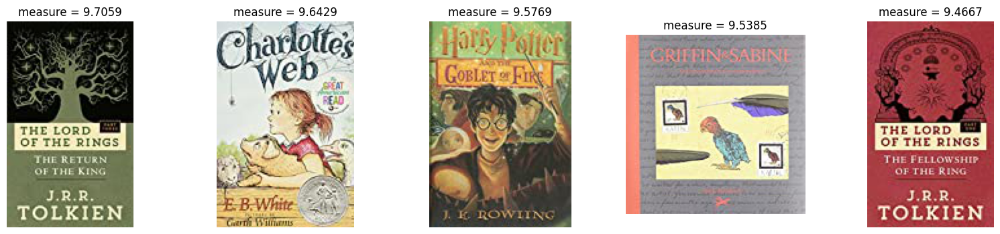

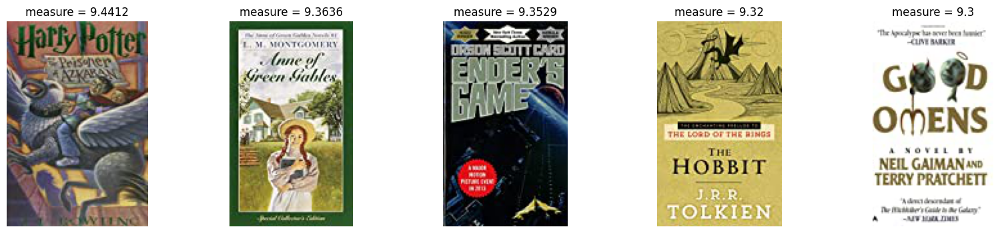

,Book-Title,picture_url,Avg-Rating
25204,"The Return of the King (The Lord of the Rings,...",http://images.amazon.com/images/P/0345339738.0...,9.705882
36775,Charlotte's Web (Trophy Newbery),http://images.amazon.com/images/P/0064400557.0...,9.642857
12603,Harry Potter and the Goblet of Fire (Book 4),http://images.amazon.com/images/P/0439139597.0...,9.576923
30655,Griffin &amp; Sabine: An Extraordinary Corresp...,http://images.amazon.com/images/P/0877017883.0...,9.538462
29398,The Fellowship of the Ring (The Lord of the Ri...,http://images.amazon.com/images/P/0345339703.0...,9.466667
12755,Harry Potter and the Prisoner of Azkaban (Book 3),http://images.amazon.com/images/P/0439136350.0...,9.441176
50656,Anne of Green Gables (Anne of Green Gables Nov...,http://images.amazon.com/images/P/055321313X.0...,9.363636
22754,Ender's Game (Ender Wiggins Saga (Paperback)),http://images.amazon.com/images/P/0812550706.0...,9.352941
1844,The Hobbit : The Enchanting Prelude to The Lor...,http://images.amazon.com/images/P/0345339681.0...,9.320000
34218,Good Omens,http://images.amazon.com/images/P/0441003257.0...,9.300000


In [ ]:
clusterization.get_rec(1400, euclidean_distances)

### Косинусная близость будет давать результаты из более ограниченного набора, т.к. более чувствительна к отличиям между пользователями. С другой стороны, евклидово расстояние будет рекомендовать более рейтинговые книги, хотя мы уже не можем быть полнотью уверены, что они подойдут покупателю, поскольку эта метрика возрастает медленнее, чем убывает косинусная близость, а значит будет считать двух пользователей более похожими, чем это сделает косинусная близость.

# Задание 3

In [ ]:
class Recomendations():
    def __init__(self, Int: pd.DataFrame):
        # Создаём словарь для того, чтобы по product_id возвращать url товара
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates(subset="product_id").values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
        self.ratings = Int[["product_id", "Avg-Rating"]].drop_duplicates()
        self.ratings.set_index("product_id", inplace=True)

    def coocurrency_count(self):
        Int = self.interactions[["vid", "product_id"]].drop_duplicates()

        # Для каждого пользователя собираем товары, с которыми он взамиодействовал
        user_products = Int.groupby(["vid"])["product_id"].apply(list).reset_index()
        # Заводим словарь под товары
        cooc = {}
        for i in tqdm.tqdm_notebook(user_products.values):
            for j in range(len(i[1])):
                for k in range(len(i[1])):
                    if j != k:
                        try:
                            first = i[1][j]
                            second = i[1][k]
                            # Вес пары книг - полусумма их оценок
                            cooc[str(first) + "_" + str(second)] += \
                            (self.ratings.iloc[first]["Avg-Rating"] + \
                            self.ratings.iloc[second]["Avg-Rating"]) / 2
                        except:
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] = \
                            (self.ratings.iloc[first]["Avg-Rating"] + \
                            self.ratings.iloc[second]["Avg-Rating"]) / 2

        cooc_list = []
        for i, j in cooc.items():
            # Если товары встетились вместе больше одного раза, то добавляем в список
            if j != 1:
                cooc_list.append(i.split("_") + [j])
        self.cooc_rec = pd.DataFrame(cooc_list, columns=["item1", "item2", "measure"])
        self.cooc_rec = self.cooc_rec.astype(float)

    def get_rec(self, i: int, show=False):
        recs = self.cooc_rec[self.cooc_rec["item1"] == i]\
                            .sort_values("measure", ascending=False)\
                            .head(10)
        print(u"Для товара")
        print(self.interactions[self.interactions["product_id"]==i].drop_duplicates(subset="product_id")["Book-Title"].to_string())
        rec_imaging([i], self.product_id_to_url)
        print(u"Также рекомендации")
        recs_id = recs["item2"].values.astype(int)

        unique_recomendations = self.interactions[self.interactions["product_id"].isin(recs_id)].drop_duplicates(subset="product_id")
        unique_recomendations.sort_values("Avg-Rating", ascending=False, inplace=True)
        rec_imaging(unique_recomendations.product_id.array, self.product_id_to_url,
                         recs["measure"].values.astype(float))
        return unique_recomendations[["Book-Title", "picture_url", "Avg-Rating"]]

In [ ]:
coocurency = Recomendations(raw_interactions)

In [ ]:
coocurency.coocurrency_count()

<ipython-input-49-a8cf581b1744>:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm.tqdm_notebook(user_products.values):


  0%|          | 0/7435 [00:00<?, ?it/s]

In [ ]:
coocurency.cooc_rec

,item1,item2,measure
0,5351.0,5047.0,7.780
1,5351.0,1363.0,7.485
2,5351.0,1370.0,8.085
3,5351.0,1682.0,8.000
4,5047.0,5351.0,7.780
...,...,...,...
1968871,4169.0,4554.0,7.320
1968872,4169.0,9552.0,7.450
1968873,9552.0,4554.0,7.270
1968874,9552.0,9793.0,7.450


In [ ]:
find_book_idx("Harry Potter", raw_interactions)

idx: 4185 	Book Title: Harry Potter and the Order of the Phoenix (Book 5)
idx: 6955 	Book Title: Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))
idx: 4170 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 4190 	Book Title: Harry Potter and the Chamber of Secrets Postcard Book
idx: 4178 	Book Title: Harry Potter and the Goblet of Fire (Book 4)
idx: 6954 	Book Title: Harry Potter and the Sorcerer's Stone (Book 1)
idx: 4176 	Book Title: Harry Potter and the Prisoner of Azkaban (Book 3)
idx: 4171 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 4177 	Book Title: Harry Potter and the Prisoner of Azkaban (Book 3)
idx: 4179 	Book Title: Harry Potter and the Goblet of Fire (Book 4)
idx: 4186 	Book Title: Harry Potter and the Sorcerer's Stone (Book 1)
idx: 4188 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 9620 	Book Title: Ultimate Unofficial Guide to the Mysteries of Harry Potter
idx: 10162 	Book Title: Harry Potter et l

Для товара
209    Harry Potter and the Order of the Phoenix (Boo...


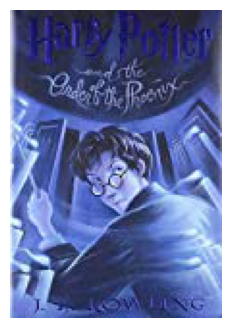

Также рекомендации


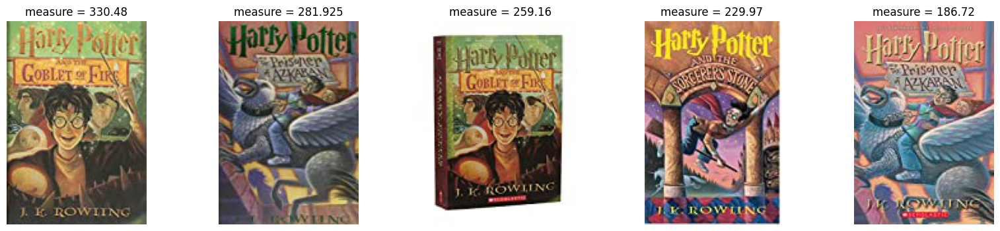

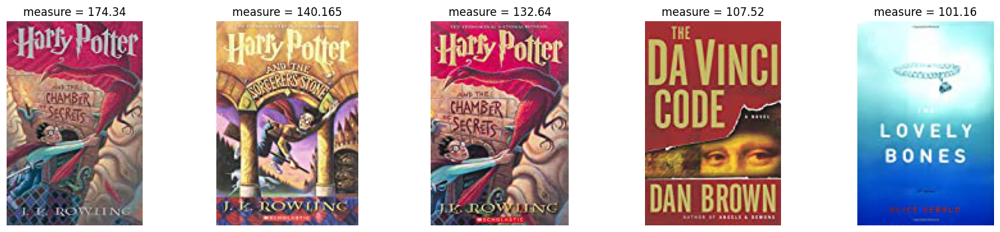

,Book-Title,picture_url,Avg-Rating
12603,Harry Potter and the Goblet of Fire (Book 4),http://images.amazon.com/images/P/0439139597.0...,9.39
12755,Harry Potter and the Prisoner of Azkaban (Book 3),http://images.amazon.com/images/P/0439136350.0...,9.16
28756,Harry Potter and the Goblet of Fire (Book 4),http://images.amazon.com/images/P/0439139600.0...,9.09
12670,Harry Potter and the Sorcerer's Stone (Book 1),http://images.amazon.com/images/P/0590353403.0...,9.08
23970,Harry Potter and the Prisoner of Azkaban (Book 3),http://images.amazon.com/images/P/0439136369.0...,9.03
2704,Harry Potter and the Chamber of Secrets (Book 2),http://images.amazon.com/images/P/0439064864.0...,9.00
327,Harry Potter and the Sorcerer's Stone (Harry P...,http://images.amazon.com/images/P/059035342X.0...,8.98
23813,Harry Potter and the Chamber of Secrets (Book 2),http://images.amazon.com/images/P/0439064872.0...,8.86
9477,The Da Vinci Code,http://images.amazon.com/images/P/0385504209.0...,8.53
1343,The Lovely Bones: A Novel,http://images.amazon.com/images/P/0316666343.0...,8.33


In [ ]:
coocurency.get_rec(4185)

# Задание 4

In [ ]:
class Collaborative():
    def __init__(self, interactions):
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[int(i)] = j
        self.csr_rates = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])),
                                    shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))
        self.interactions = interactions


    def user_based(self, idx):
        user_rates = self.csr_rates.getrow(idx).toarray()[0]
        watched_items = np.where(user_rates != 0)[0]
        # считаем косинус между пользователем idx и всеми пользователями
        metrics = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)
        # домножаем оценки пользователя на коэффициент похожести
        rates = csr_matrix.multiply(self.csr_rates.copy(), metrics)
        # чтобы не рекомендовать уже просмотренные - зануляем веса просмотренных
        total_rate = (1 - user_rates.astype(bool)) * np.array(np.sum(rates, axis=0))[0]
        # печатаем рекомендации
        self.get_rec(watched_items, np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

        rec_idx = np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]]
        recomendations = self.interactions[self.interactions["product_id"].isin(rec_idx)].drop_duplicates(subset="product_id")\
            [["product_id", "Book-Title", "picture_url", "Avg-Rating"]]
        order = pd.DataFrame(data = {"product_id": rec_idx, "measure": np.sort(total_rate)[::-1][:10]})
        recomendations = pd.merge(recomendations, order, on="product_id")
        return recomendations.sort_values("measure", ascending=False)[["Book-Title", "picture_url", "Avg-Rating", "measure"]]


    def item_based(self, idx):
        item_rates = self.csr_rates.getcol(idx).toarray().reshape(1, -1)
        # считаем косинус между товаром idx и всеми пользователями
        metrics = cosine_similarity(item_rates, self.csr_rates.T).reshape(-1, 1)
        # домножаем оценки пользователя на коэффициент похожести
        rates = csr_matrix.multiply(self.csr_rates.T.copy(), metrics)
        total_rate = np.array(np.sum(rates, axis=1)).ravel()
        # печатаем рекомендации
        self.get_rec([idx], np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

        rec_idx = np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]]
        recomendations = self.interactions[self.interactions["product_id"].isin(rec_idx)].drop_duplicates(subset="product_id")\
            [["product_id", "Book-Title", "picture_url", "Avg-Rating"]]

        order = pd.DataFrame(data = {"product_id": rec_idx, "measure": np.sort(total_rate)[::-1][:10]})
        recomendations = pd.merge(recomendations, order, on="product_id")
        return recomendations.sort_values("measure", ascending=False)[["Book-Title", "picture_url", "Avg-Rating", "measure"]]


    def get_rec(self, watched, recs, measure):
        print(u"Для таких товаров")
        rec_imaging([i for i in watched], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging([i for i in recs], self.content_dict, measure)

In [ ]:
collaboration = Collaborative(raw_interactions)

Для таких товаров


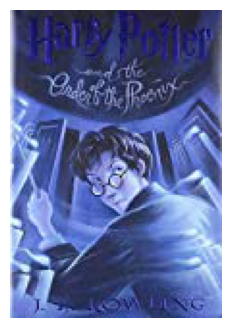

Такие рекомендации


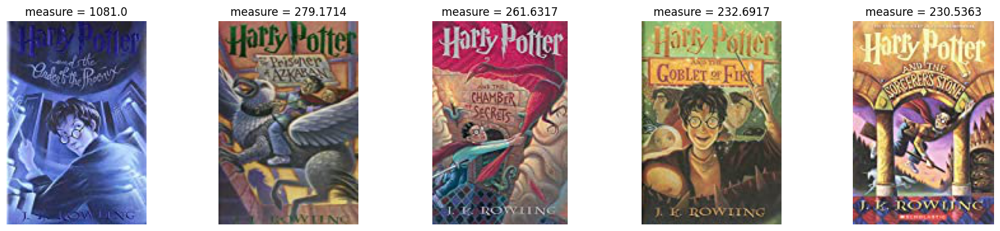

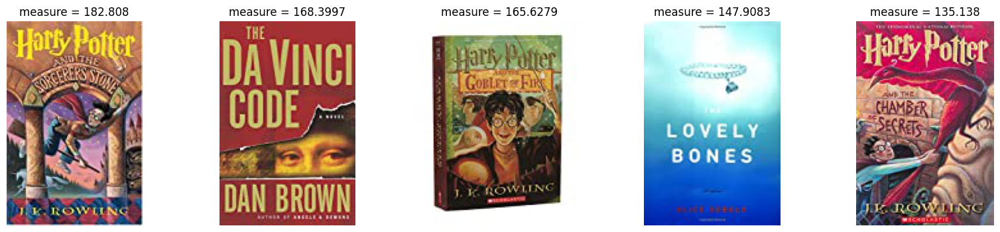

,Book-Title,picture_url,Avg-Rating,measure
0,Harry Potter and the Order of the Phoenix (Boo...,http://images.amazon.com/images/P/043935806X.0...,9.16,1081.000000
7,Harry Potter and the Prisoner of Azkaban (Book 3),http://images.amazon.com/images/P/0439136350.0...,9.16,279.171418
3,Harry Potter and the Chamber of Secrets (Book 2),http://images.amazon.com/images/P/0439064864.0...,9.00,261.631747
5,Harry Potter and the Goblet of Fire (Book 4),http://images.amazon.com/images/P/0439139597.0...,9.39,232.691743
1,Harry Potter and the Sorcerer's Stone (Harry P...,http://images.amazon.com/images/P/059035342X.0...,8.98,230.536271
6,Harry Potter and the Sorcerer's Stone (Book 1),http://images.amazon.com/images/P/0590353403.0...,9.08,182.808049
4,The Da Vinci Code,http://images.amazon.com/images/P/0385504209.0...,8.53,168.399708
9,Harry Potter and the Goblet of Fire (Book 4),http://images.amazon.com/images/P/0439139600.0...,9.09,165.627946
2,The Lovely Bones: A Novel,http://images.amazon.com/images/P/0316666343.0...,8.33,147.908339
8,Harry Potter and the Chamber of Secrets (Book 2),http://images.amazon.com/images/P/0439064872.0...,8.86,135.138031


In [ ]:
collaboration.item_based(4185)

Для таких товаров


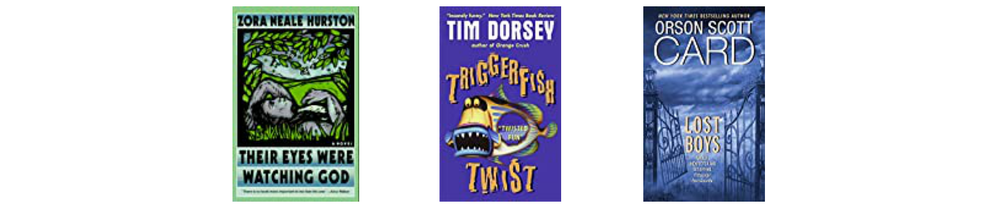

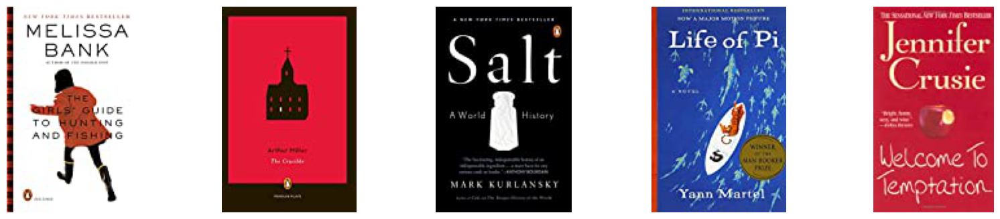

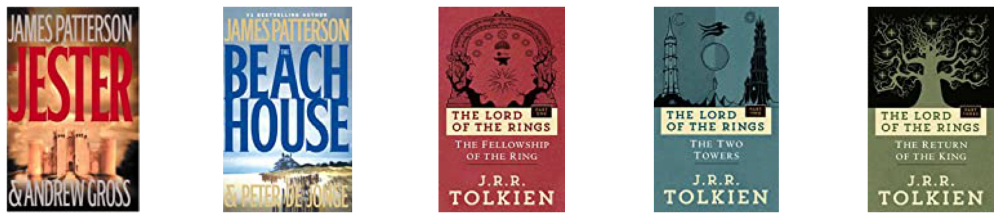

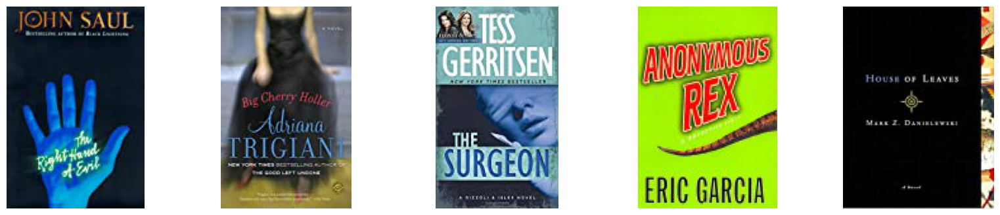

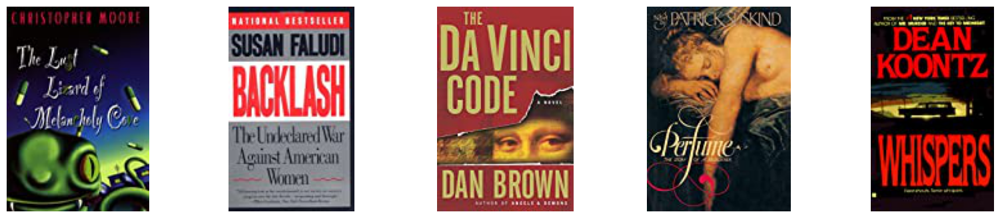

...

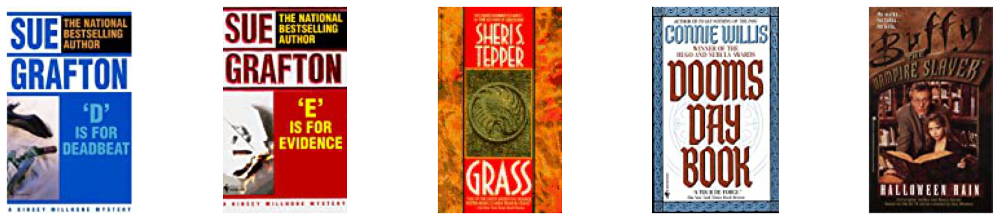

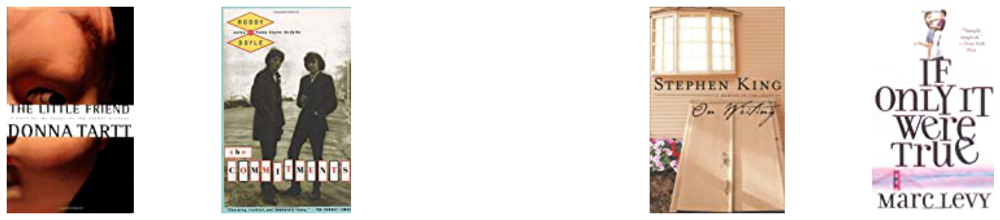

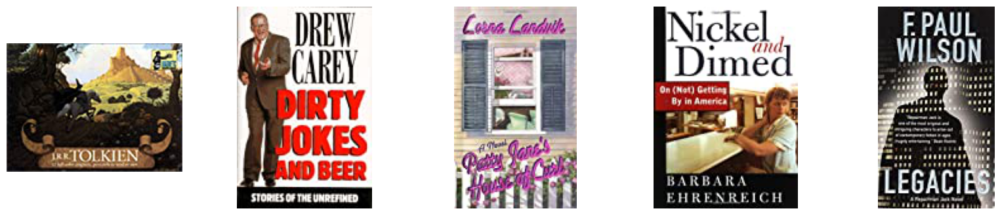

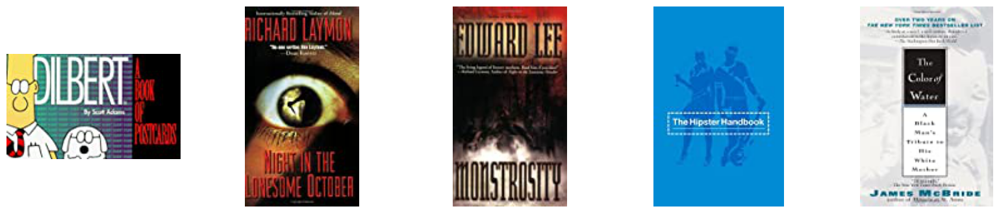

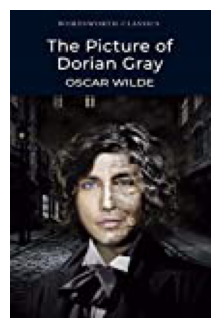

Такие рекомендации


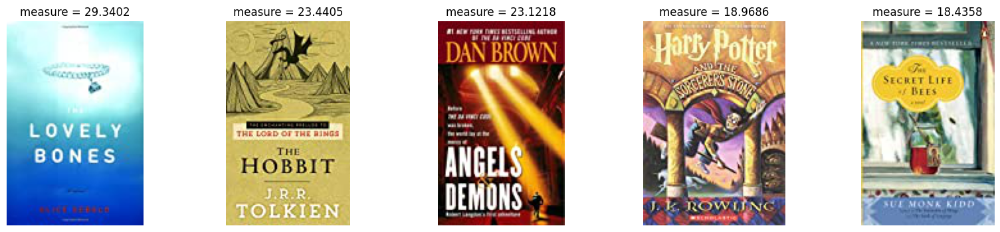

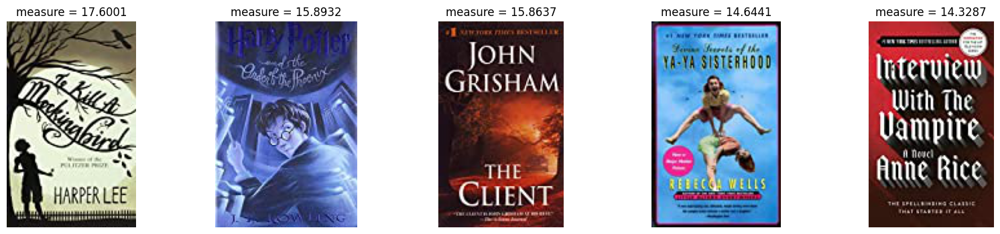

,Book-Title,picture_url,Avg-Rating,measure
3,The Lovely Bones: A Novel,http://images.amazon.com/images/P/0316666343.0...,8.33,29.340152
4,The Hobbit : The Enchanting Prelude to The Lor...,http://images.amazon.com/images/P/0345339681.0...,9.05,23.440451
6,Angels &amp; Demons,http://images.amazon.com/images/P/0671027360.0...,8.26,23.121813
1,Harry Potter and the Sorcerer's Stone (Harry P...,http://images.amazon.com/images/P/059035342X.0...,8.98,18.968594
5,The Secret Life of Bees,http://images.amazon.com/images/P/0142001740.0...,8.53,18.435798
2,To Kill a Mockingbird,http://images.amazon.com/images/P/0446310786.0...,9.14,17.600141
0,Harry Potter and the Order of the Phoenix (Boo...,http://images.amazon.com/images/P/043935806X.0...,9.16,15.893180
8,The Client,http://images.amazon.com/images/P/0440213525.0...,7.86,15.863678
9,Divine Secrets of the Ya-Ya Sisterhood: A Novel,http://images.amazon.com/images/P/0060928336.0...,8.02,14.644141
7,Interview with the Vampire,http://images.amazon.com/images/P/0345337662.0...,7.80,14.328703


In [ ]:
collaboration.user_based(4360)

### User-based рекомендации дают более разнообразные варианты. В целом это логично, поскольку человек как правило не зацикливается на одно серии книг, а ищет похожие. Item-based же, наоборот, ищет книги преимущественно из одной серии, т.к. они покупаются одной и той же группой людей.